In [2]:
pip install ucimlrepo

In [3]:
# Task 1 : Dataset Exploration
from ucimlrepo import fetch_ucirepo
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

# Make all labels bold globally
plt.rcParams['axes.labelweight'] = 'bold'
plt.rcParams['font.weight'] = 'bold'
plt.rcParams['axes.titleweight'] = 'bold'

# Load dataset
banknote_authentication = fetch_ucirepo(id=267)
X = banknote_authentication.data.features
y = banknote_authentication.data.targets

df = pd.concat([X, y], axis=1)
df.columns = ['variance', 'skewness', 'curtosis', 'entropy', 'class']

# First 5 samples
print("First 5 samples:\n", df.head())

# Dataset dimensions
print("Shape:", df.shape)

# Missing values
print("Missing values:", df.isnull().sum().sum())

# Descriptive statistics
print("Class distribution:\n", df['class'].value_counts())
print("Descriptive statistics:\n", df.describe())


First 5 samples:
    variance  skewness  curtosis  entropy  class
0   3.62160    8.6661   -2.8073 -0.44699      0
1   4.54590    8.1674   -2.4586 -1.46210      0
2   3.86600   -2.6383    1.9242  0.10645      0
3   3.45660    9.5228   -4.0112 -3.59440      0
4   0.32924   -4.4552    4.5718 -0.98880      0
Shape: (1372, 5)
Missing values: 0
Class distribution:
 class
0    762
1    610
Name: count, dtype: int64
Descriptive statistics:
           variance     skewness     curtosis      entropy        class
count  1372.000000  1372.000000  1372.000000  1372.000000  1372.000000
mean      0.433735     1.922353     1.397627    -1.191657     0.444606
std       2.842763     5.869047     4.310030     2.101013     0.497103
min      -7.042100   -13.773100    -5.286100    -8.548200     0.000000
25%      -1.773000    -1.708200    -1.574975    -2.413450     0.000000
50%       0.496180     2.319650     0.616630    -0.586650     0.000000
75%       2.821475     6.814625     3.179250     0.394810     1.00

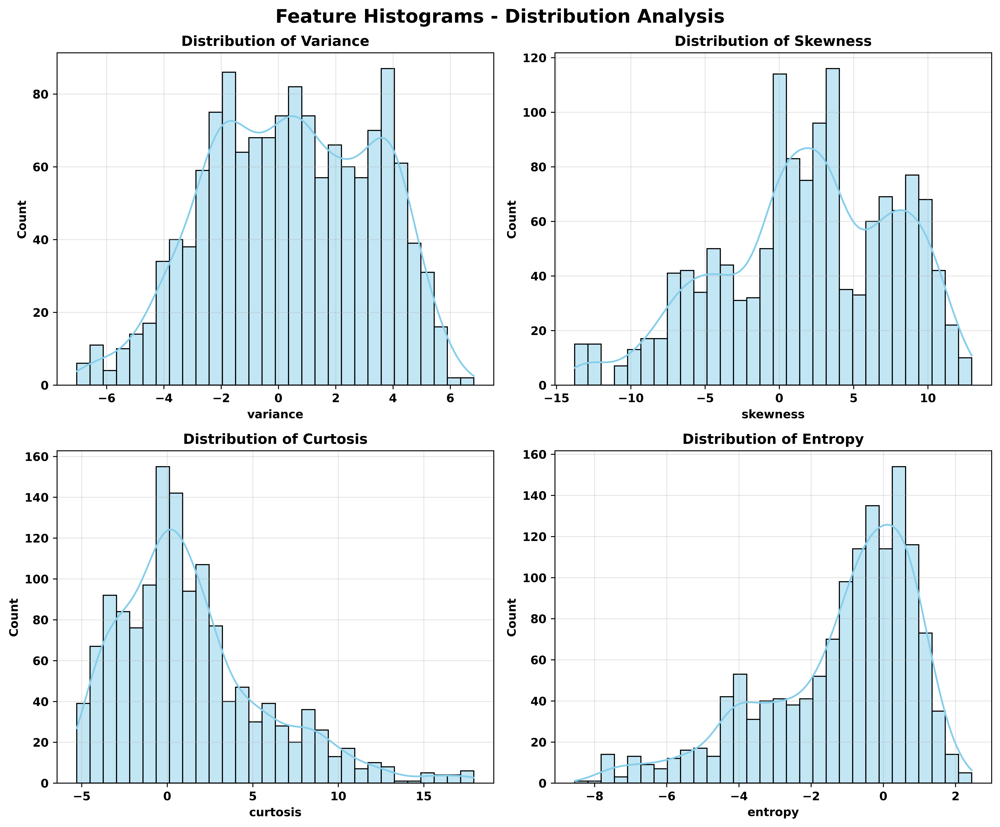

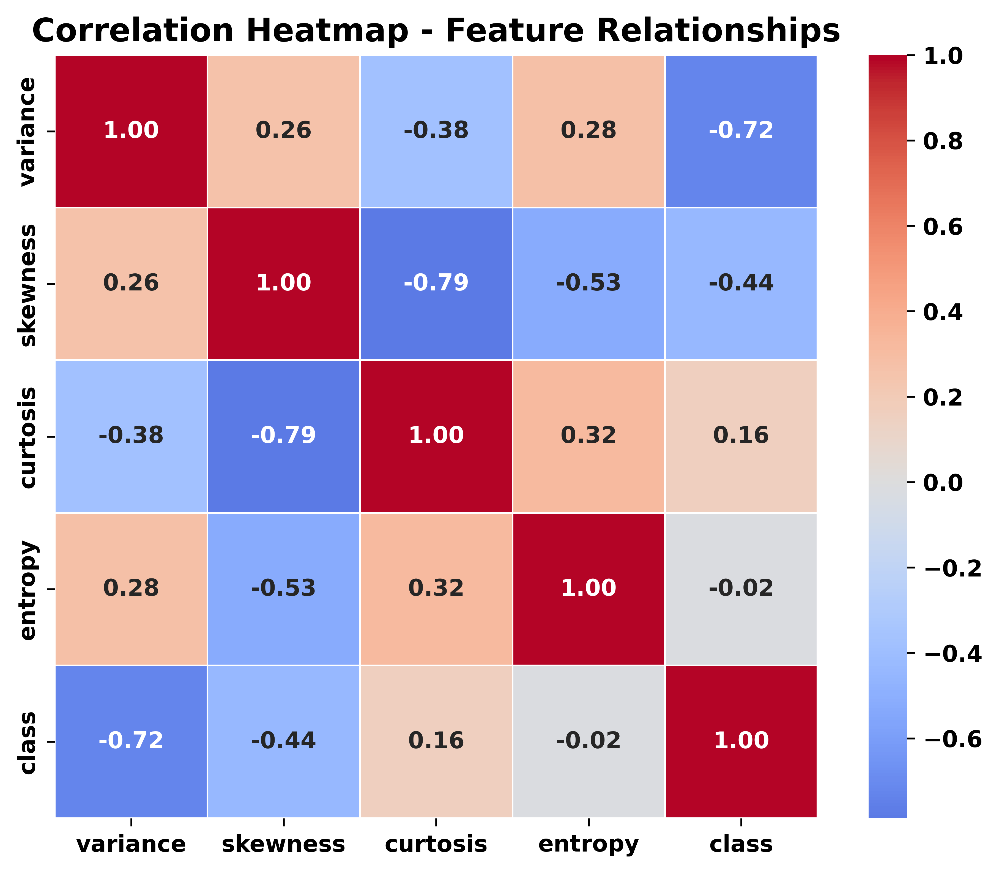

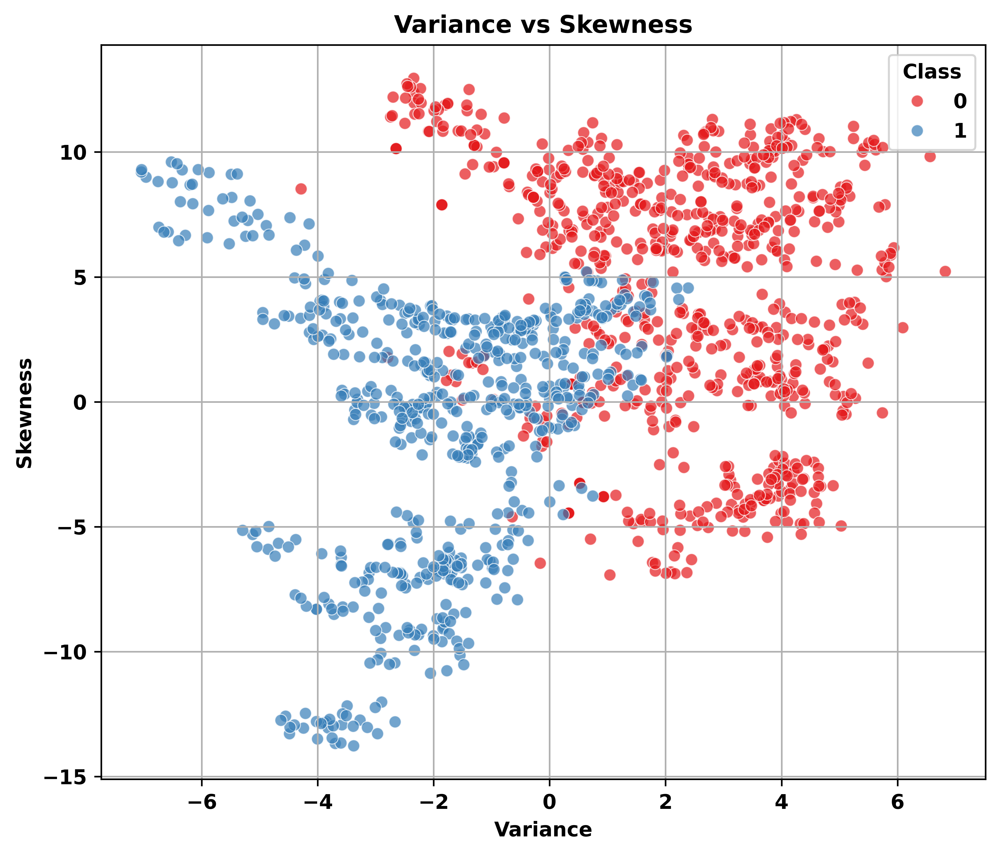

/tmp/ipykernel_619/2472548529.py:55: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='class', y=feature, ax=axes[row, col], palette='Set2')
/tmp/ipykernel_619/2472548529.py:55: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='class', y=feature, ax=axes[row, col], palette='Set2')
/tmp/ipykernel_619/2472548529.py:55: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='class', y=feature, ax=axes[row, col], palette='Set2')
/tmp/ipykernel_619/2472548529.py:55: FutureWarning: 

Passing `palette` without assigning `hue` is d

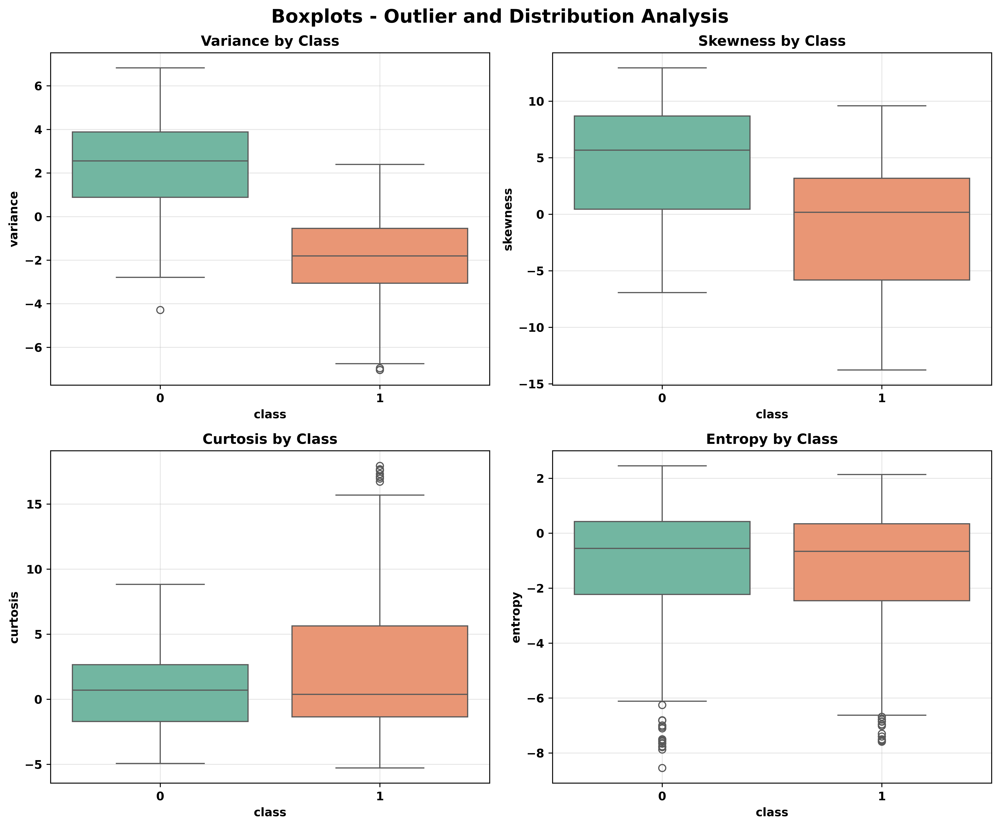

In [13]:
# Task 2: Exploratory Data Analysis
import matplotlib.pyplot as plt
import seaborn as sns

plt.rcParams['figure.dpi'] = 600
plt.rcParams['savefig.dpi'] = 600
plt.rcParams['savefig.format'] = 'eps'

# 1. Feature Histograms with KDE in Subplots
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
features = ['variance', 'skewness', 'curtosis', 'entropy']

for i, feature in enumerate(features):
    row, col = divmod(i, 2)
    sns.histplot(data=df, x=feature, kde=True, ax=axes[row, col], bins=30, color='skyblue')
    axes[row, col].set_title(f'Distribution of {feature.capitalize()}', fontsize=12)
    axes[row, col].set_xlabel(feature)
    axes[row, col].grid(True, alpha=0.3)

plt.suptitle('Feature Histograms - Distribution Analysis', fontweight='bold', fontsize=16)
plt.tight_layout()
plt.savefig('feature_histograms.eps', dpi=600, bbox_inches='tight')

# 2. Correlation Heatmap
plt.figure(figsize=(8, 6))
corr_matrix = df.corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', center=0, fmt='.2f',
            square=True, linewidths=0.5)
plt.title('Correlation Heatmap - Feature Relationships', fontsize=14)
plt.savefig('correlation_heatmap.eps', dpi=600, bbox_inches='tight')

# 3. Scatter Plot
plt.figure(figsize=(7,6))
sns.scatterplot(
    data=df,
    x='variance',
    y='skewness',
    hue='class',
    palette='Set1',
    alpha=0.7
)
plt.title("Variance vs Skewness")
plt.xlabel("Variance")
plt.ylabel("Skewness")
plt.legend(title="Class")
plt.grid(True)
plt.tight_layout()
plt.savefig("scatter_plot.eps", dpi=600, bbox_inches="tight")
plt.show()

# 4. Boxplots in Subplots
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
for i, feature in enumerate(features):
    row, col = divmod(i, 2)
    sns.boxplot(data=df, x='class', y=feature, ax=axes[row, col], palette='Set2')
    axes[row, col].set_title(f'{feature.capitalize()} by Class')
    axes[row, col].grid(True, alpha=0.3)

plt.suptitle('Boxplots - Outlier and Distribution Analysis', fontweight='bold', fontsize=16)
plt.tight_layout()
plt.savefig('boxplots.eps', dpi=600, bbox_inches='tight')

In [5]:
# Task 3  : Data Preprocessing
X = df.drop('class', axis=1)
y = df['class'].values.ravel()

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42, stratify=y)

In [6]:
# Task 4: Perceptron Implementation from Scratch
import numpy as np

class Perceptron:
    def __init__(self, learning_rate=0.01, epochs=50):
        self.learning_rate = learning_rate
        self.epochs = epochs
        self.weights = None
        self.bias = None
        self.history = {'weights': [], 'bias': [], 'misclassified': []}

    def step_function(self, x):
        # Step Activation Function
        return np.where(x >= 0, 1, 0)

    def fit(self, X, y):
        # Train the Perceptron
        X = np.array(X)
        y = np.array(y).reshape(-1)

        n_samples, n_features = X.shape

        # Weight and Bias Initialization
        self.weights = np.zeros(n_features)
        self.bias = 0.0

        best_misclassified = float('inf')
        best_weights = self.weights.copy()
        best_bias = self.bias

        for epoch in range(1, self.epochs + 1):
            misclassified = 0

            for i in range(n_samples):
                # Forward Propagation
                linear_output = np.dot(X[i], self.weights) + self.bias
                y_pred = self.step_function(linear_output)

                # Perceptron Learning Rule
                error = y[i] - y_pred

                if error != 0:
                    # Update weights and bias
                    self.weights += self.learning_rate * error * X[i]
                    self.bias += self.learning_rate * error
                    misclassified += 1

            # Store history
            self.history['weights'].append(self.weights.copy())
            self.history['bias'].append(self.bias)
            self.history['misclassified'].append(misclassified)

            if misclassified < best_misclassified:
              best_misclassified = misclassified
              best_weights = self.weights.copy()
              best_bias = self.bias

        self.weights = best_weights
        self.bias = best_bias
        return self

    def predict(self, X):
        # Make predictions
        X = np.array(X)
        linear_output = np.dot(X, self.weights) + self.bias
        return self.step_function(linear_output)


# Initialize
perceptron = Perceptron(learning_rate=0.01, epochs=30)

Epoch  | Misclassified   | Weights                               | Bias      
1      | 59              | [ -0.0680  -0.0938  -0.0678  -0.0110] | -0.030000
2      | 25              | [ -0.0775  -0.1042  -0.0811   0.0035] | -0.040000
3      | 20              | [ -0.0802  -0.1127  -0.0917  -0.0036] | -0.040000
4      | 19              | [ -0.0883  -0.1196  -0.1001   0.0089] | -0.050000
5      | 20              | [ -0.0991  -0.1295  -0.1037   0.0102] | -0.050000
6      | 17              | [ -0.1027  -0.1277  -0.1134  -0.0010] | -0.060000
7      | 24              | [ -0.1081  -0.1393  -0.1108  -0.0094] | -0.060000
8      | 22              | [ -0.1170  -0.1357  -0.1319  -0.0025] | -0.060000
9      | 20              | [ -0.1176  -0.1470  -0.1364  -0.0062] | -0.060000
10     | 20              | [ -0.1307  -0.1541  -0.1250  -0.0060] | -0.060000
11     | 22              | [ -0.1345  -0.1641  -0.1329  -0.0018] | -0.060000
12     | 20              | [ -0.1287  -0.1600  -0.1472   0.0076] | -0.08000

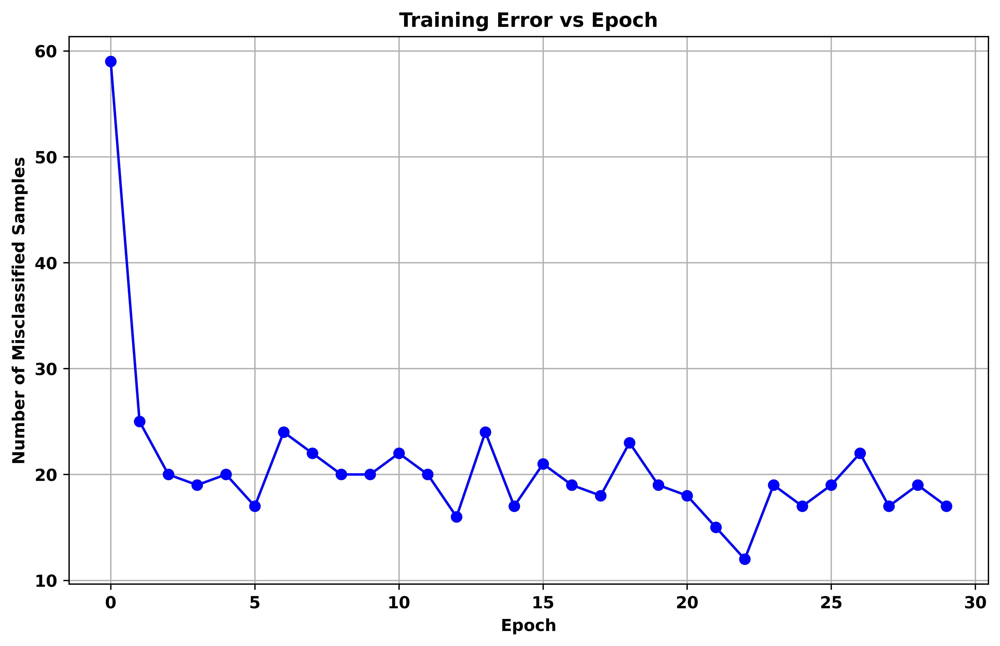

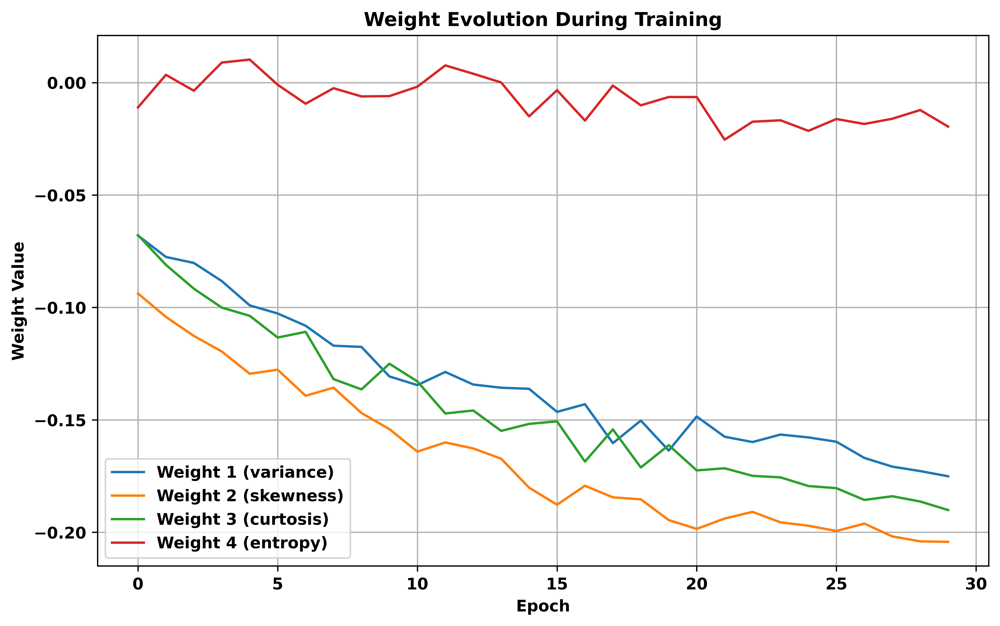

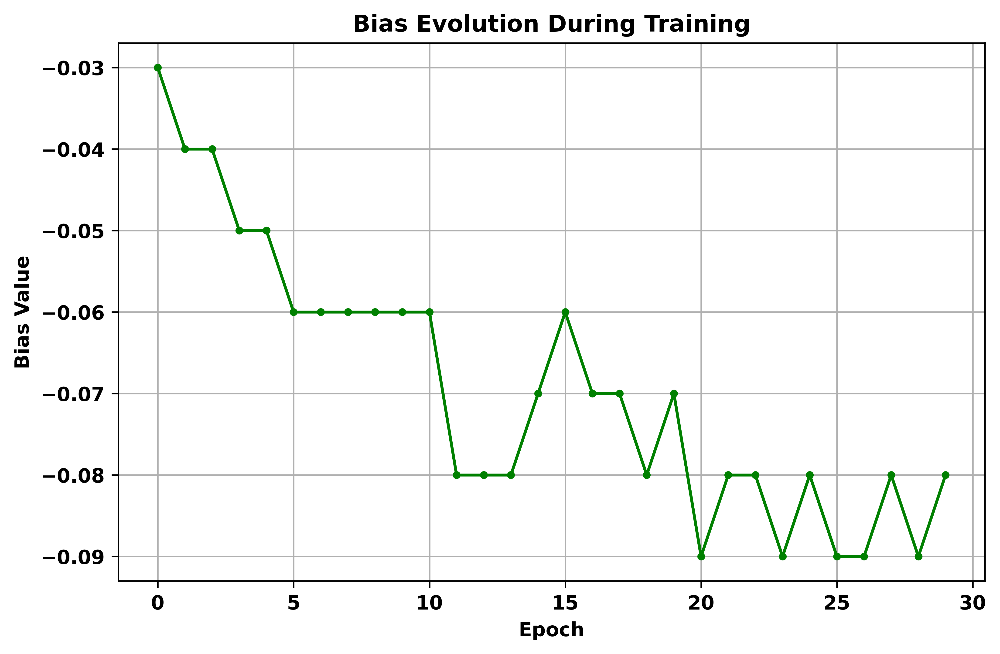

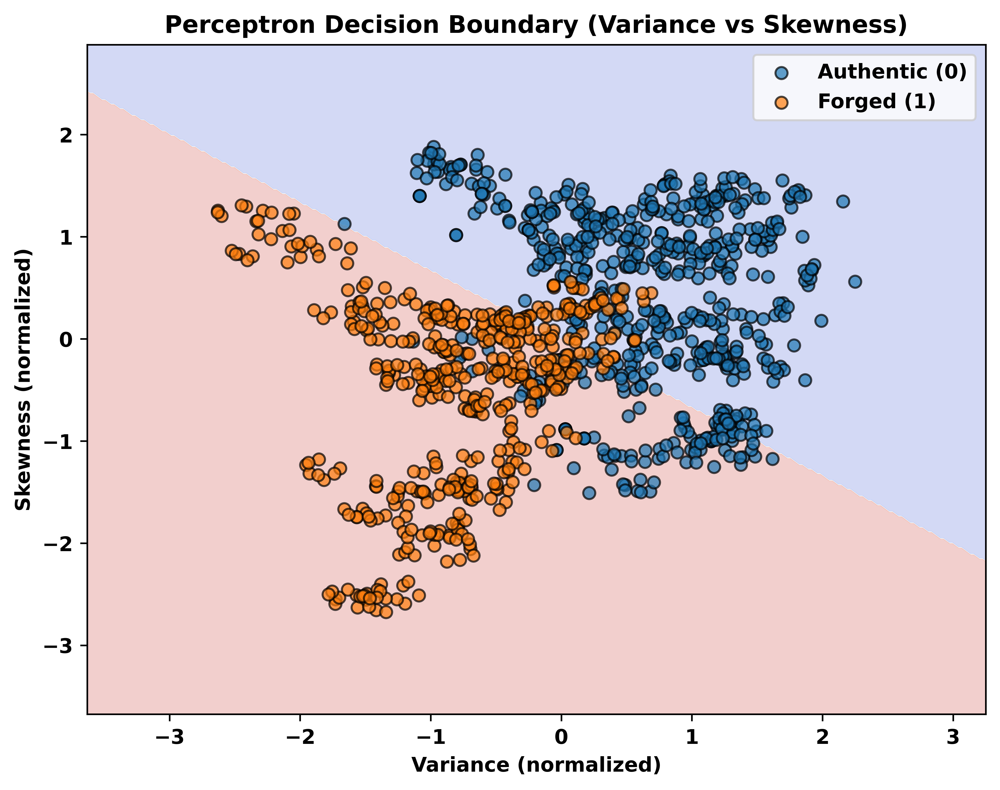

In [7]:
# Task 5: Model Training
# Train
perceptron.fit(X_train, y_train)

errors_lr_001 = perceptron.history['misclassified']

# Display
print(f"{'Epoch':<6} | {'Misclassified':<15} | {'Weights':<37} | {'Bias':<10}")

# Print every epoch from history
for epoch in range(1, perceptron.epochs + 1):
    w = np.round(perceptron.history['weights'][epoch-1], 4)
    b = perceptron.history['bias'][epoch-1]
    m = perceptron.history['misclassified'][epoch-1]
    weights_str = '[' + ' '.join(f'{val:8.4f}' for val in w) + ']'
    print(f"{epoch:<6} | {m:<15} | {weights_str} | {b:.6f}")

print("\n" + "="*130)
print("FINAL RESULT")
print("="*130)
print(f"Final Weights : {np.round(perceptron.weights, 6)}")
print(f"Final Bias    : {perceptron.bias:.6f}")

# Training Error vs Epoch
plt.figure(figsize=(10, 6))
plt.plot(perceptron.history['misclassified'], marker='o', color='blue')
plt.title('Training Error vs Epoch')
plt.xlabel('Epoch')
plt.ylabel('Number of Misclassified Samples')
plt.grid(True)
plt.savefig('training_error_vs_epoch.eps', dpi=600, bbox_inches='tight')
plt.show()

# Weight Evolution
weights_hist = np.array(perceptron.history['weights'])
plt.figure(figsize=(10, 6))
for i in range(weights_hist.shape[1]):
    plt.plot(weights_hist[:, i], label=f'Weight {i+1} ({df.columns[i]})')
plt.title('Weight Evolution During Training')
plt.xlabel('Epoch')
plt.ylabel('Weight Value')
plt.legend()
plt.grid(True)
plt.savefig('weight_evolution.eps', dpi=600, bbox_inches='tight')
plt.show()

# Bias Evolution
plt.figure(figsize=(8, 5))
plt.plot(perceptron.history['bias'], marker='.', color='green')
plt.title('Bias Evolution During Training')
plt.xlabel('Epoch')
plt.ylabel('Bias Value')
plt.grid(True)
plt.savefig('bias_evolution.eps', dpi=600, bbox_inches='tight')
plt.show()

# Decision Boundary (using two features: Variance & Skewness)
feat_idx = [0, 1]  # Variance, Skewness
X_2d = X_train[:, feat_idx]
y_2d = y_train

model_2d = Perceptron(learning_rate=0.01, epochs=30)
model_2d.fit(X_2d, y_2d)

# Build mesh grid over feature space
x_min, x_max = X_2d[:, 0].min() - 1, X_2d[:, 0].max() + 1
y_min, y_max = X_2d[:, 1].min() - 1, X_2d[:, 1].max() + 1
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 300),
                      np.linspace(y_min, y_max, 300))
grid = np.c_[xx.ravel(), yy.ravel()]
Z = model_2d.predict(grid).reshape(xx.shape)

# Plot
plt.figure(figsize=(8, 6))
plt.contourf(xx, yy, Z, alpha=0.25, cmap='coolwarm')
plt.scatter(X_2d[y_2d == 0, 0], X_2d[y_2d == 0, 1],
            label='Authentic (0)', edgecolor='k', alpha=0.7)
plt.scatter(X_2d[y_2d == 1, 0], X_2d[y_2d == 1, 1],
            label='Forged (1)', edgecolor='k', alpha=0.7)
plt.xlabel('Variance (normalized)')
plt.ylabel('Skewness (normalized)')
plt.title('Perceptron Decision Boundary (Variance vs Skewness)')
plt.legend()
plt.savefig('decision_boundary.eps', dpi=600, bbox_inches='tight')
plt.show()

Model Evaluation Metrics
Accuracy  : 0.9818 (98.18%)
Precision : 0.9606
Recall    : 1.0000
F1-score  : 0.9799

Confusion Matrix:
[[148   5]
 [  0 122]]


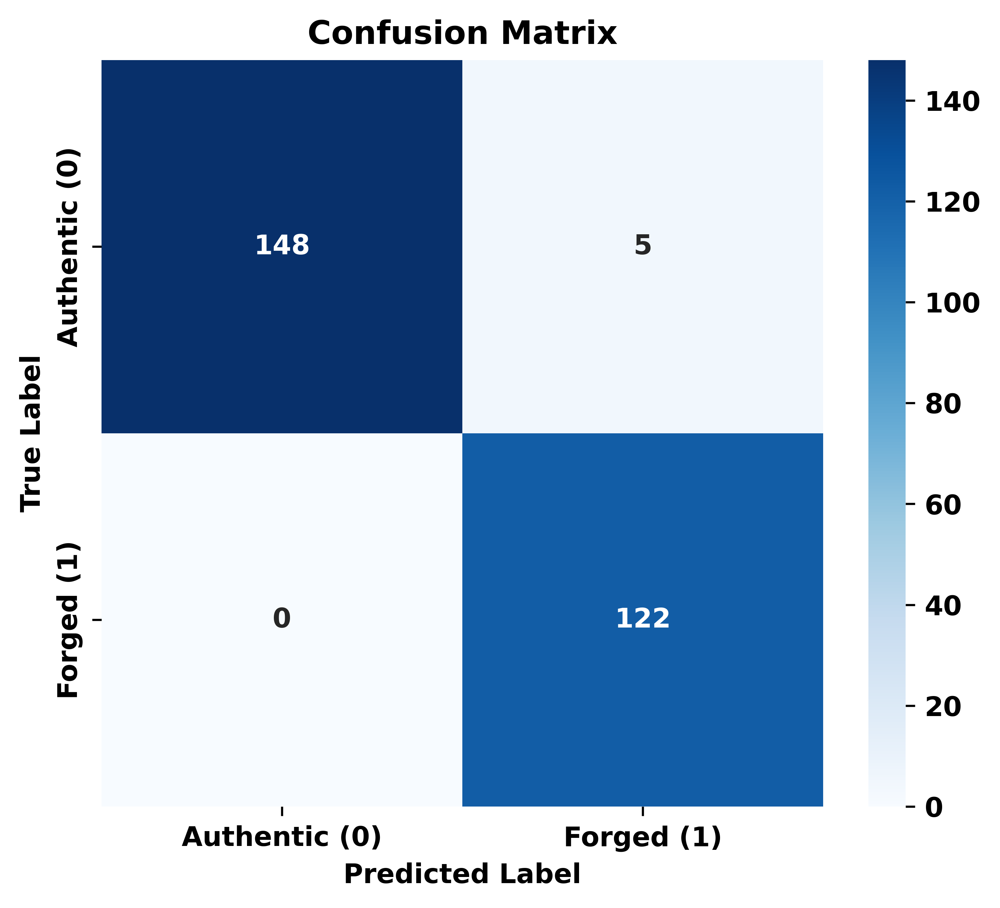

PERFORMANCE SUMMARY TABLE
Metric       Value     
Accuracy     0.9818
Precision    0.9606
Recall       1.0000
F1-score     0.9799


In [8]:
# Task 6: Model Evaluation
# Make predictions on test set
y_pred = perceptron.predict(X_test)

# Compute Metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

print("Model Evaluation Metrics")
print(f"Accuracy  : {accuracy:.4f} ({accuracy*100:.2f}%)")
print(f"Precision : {precision:.4f}")
print(f"Recall    : {recall:.4f}")
print(f"F1-score  : {f1:.4f}")

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
print("\nConfusion Matrix:")
print(cm)

# Plot Confusion Matrix
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Authentic (0)', 'Forged (1)'],
            yticklabels=['Authentic (0)', 'Forged (1)'])
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.savefig('confusion_matrix.eps', dpi=600, bbox_inches='tight')
plt.show()

# Performance Table
print("PERFORMANCE SUMMARY TABLE")
print(f"{'Metric':<12} {'Value':<10}")
print(f"{'Accuracy':<12} {accuracy:.4f}")
print(f"{'Precision':<12} {precision:.4f}")
print(f"{'Recall':<12} {recall:.4f}")
print(f"{'F1-score':<12} {f1:.4f}")

Epoch  | Misclassified   | Weights                               | Bias      
1      | 59              | [ -0.0068  -0.0094  -0.0068  -0.0011] | -0.003000
2      | 25              | [ -0.0078  -0.0104  -0.0081   0.0003] | -0.004000
3      | 20              | [ -0.0080  -0.0113  -0.0092  -0.0004] | -0.004000
4      | 19              | [ -0.0088  -0.0120  -0.0100   0.0009] | -0.005000
5      | 20              | [ -0.0099  -0.0130  -0.0104   0.0010] | -0.005000
6      | 17              | [ -0.0103  -0.0128  -0.0113  -0.0001] | -0.006000
7      | 24              | [ -0.0108  -0.0139  -0.0111  -0.0009] | -0.006000
8      | 22              | [ -0.0117  -0.0136  -0.0132  -0.0002] | -0.006000
9      | 20              | [ -0.0118  -0.0147  -0.0136  -0.0006] | -0.006000
10     | 20              | [ -0.0131  -0.0154  -0.0125  -0.0006] | -0.006000
11     | 22              | [ -0.0135  -0.0164  -0.0133  -0.0002] | -0.006000
12     | 20              | [ -0.0129  -0.0160  -0.0147   0.0008] | -0.00800

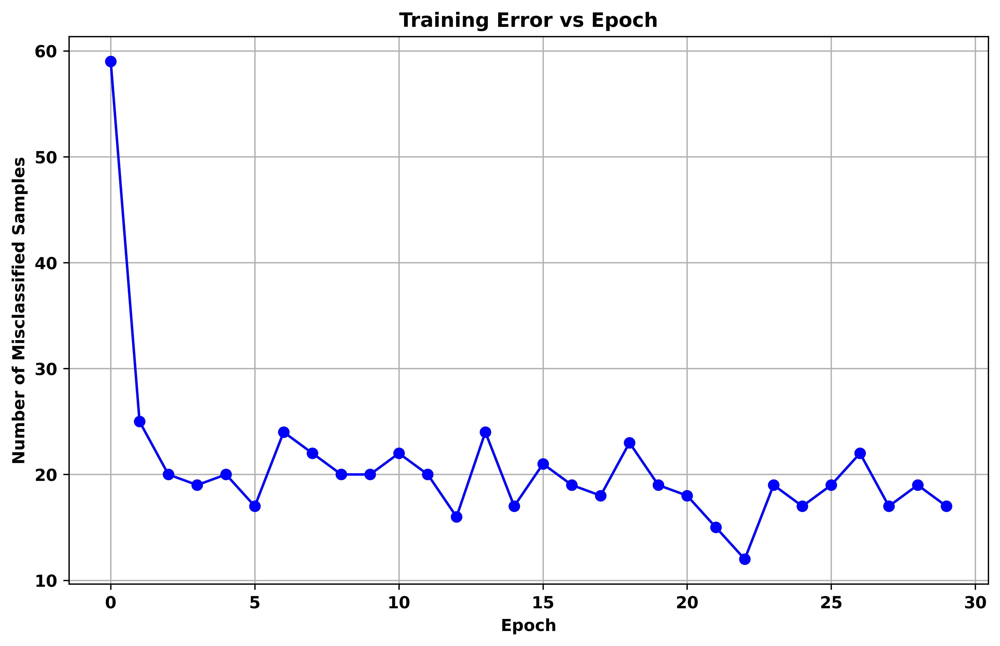

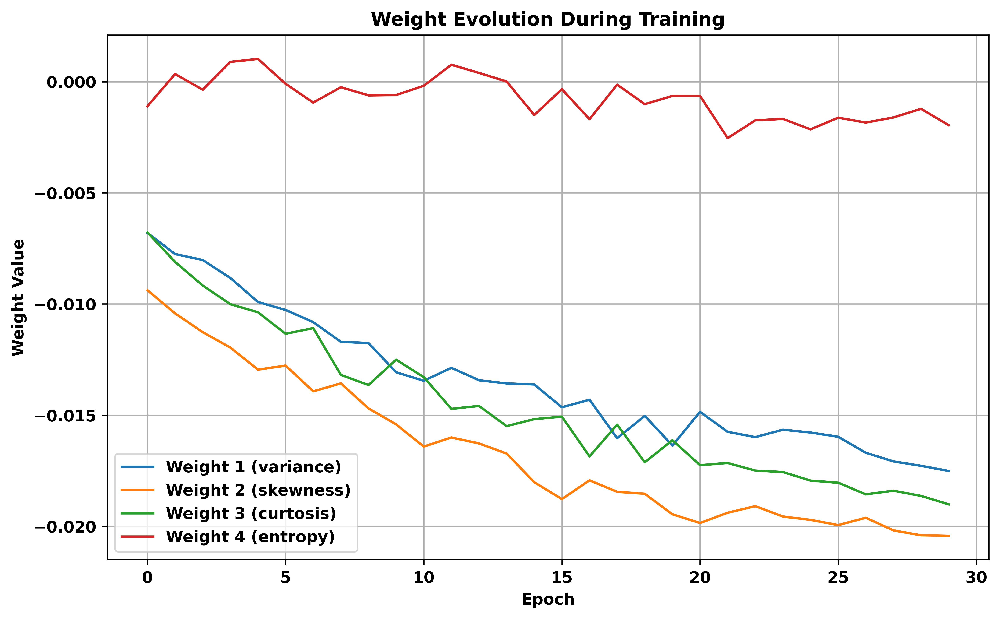

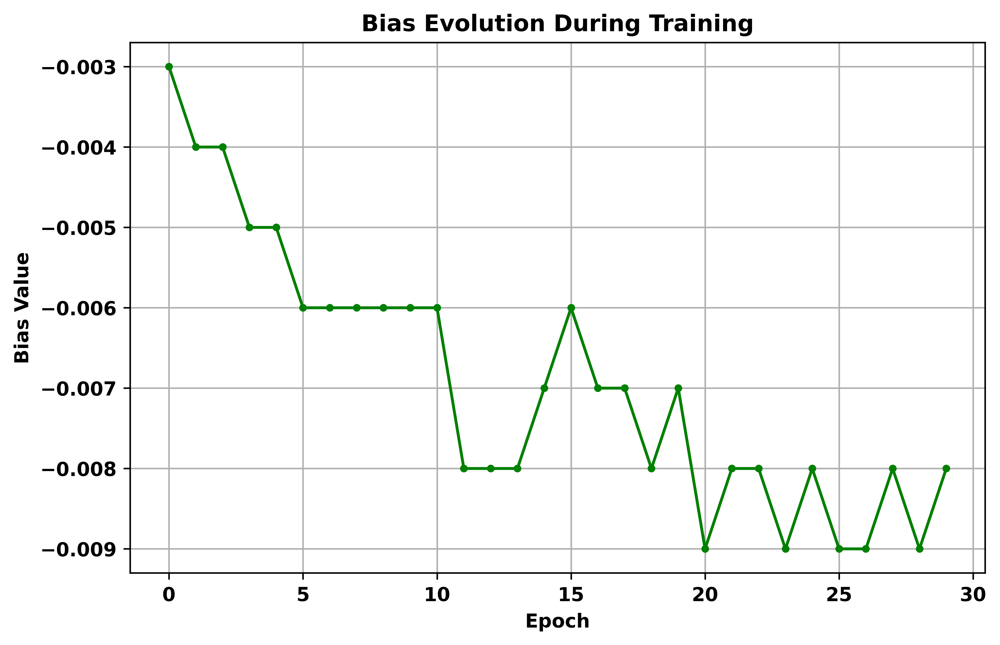

Model Evaluation Metrics
Accuracy  : 0.9818 (98.18%)
Precision : 0.9606
Recall    : 1.0000
F1-score  : 0.9799

Confusion Matrix:
[[148   5]
 [  0 122]]


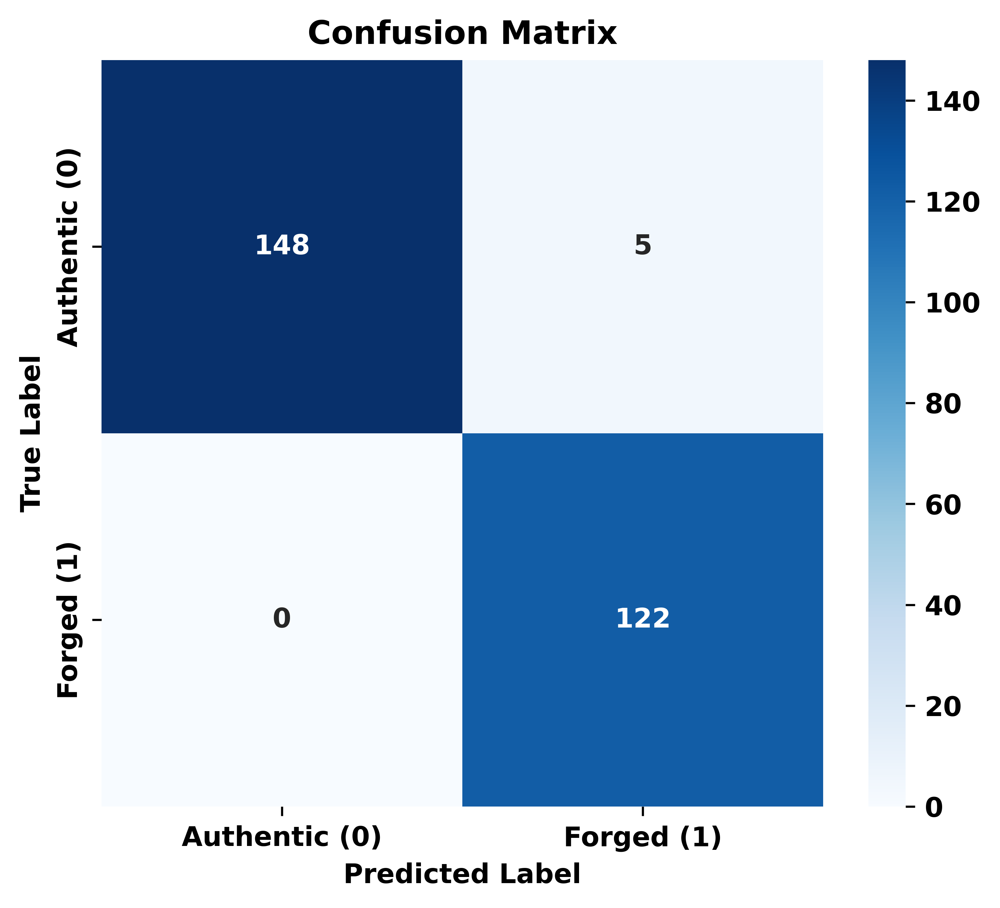

PERFORMANCE SUMMARY TABLE
Metric       Value     
Accuracy     0.9818
Precision    0.9606
Recall       1.0000
F1-score     0.9799


In [9]:
# Additional task : learning rate 0.001
import numpy as np

class Perceptron:
    def __init__(self, learning_rate=0.001, epochs=50):
        self.learning_rate = learning_rate
        self.epochs = epochs
        self.weights = None
        self.bias = None
        self.history = {'weights': [], 'bias': [], 'misclassified': []}

    def step_function(self, x):
        # Step Activation Function
        return np.where(x >= 0, 1, 0)

    def fit(self, X, y):
        # Train the Perceptron
        X = np.array(X)
        y = np.array(y).reshape(-1)

        n_samples, n_features = X.shape

        # Weight and Bias Initialization
        self.weights = np.zeros(n_features)
        self.bias = 0.0

        best_misclassified = float('inf')
        best_weights = self.weights.copy()
        best_bias = self.bias

        for epoch in range(1, self.epochs + 1):
            misclassified = 0

            for i in range(n_samples):
                # Forward Propagation
                linear_output = np.dot(X[i], self.weights) + self.bias
                y_pred = self.step_function(linear_output)

                # Perceptron Learning Rule
                error = y[i] - y_pred

                if error != 0:
                    # Update weights and bias
                    self.weights += self.learning_rate * error * X[i]
                    self.bias += self.learning_rate * error
                    misclassified += 1

            # Store history
            self.history['weights'].append(self.weights.copy())
            self.history['bias'].append(self.bias)
            self.history['misclassified'].append(misclassified)

            if misclassified < best_misclassified:
              best_misclassified = misclassified
              best_weights = self.weights.copy()
              best_bias = self.bias

        self.weights = best_weights
        self.bias = best_bias

        return self

    def predict(self, X):
        # Make predictions
        X = np.array(X)
        linear_output = np.dot(X, self.weights) + self.bias
        return self.step_function(linear_output)


# Initialize
perceptron = Perceptron(learning_rate=0.001, epochs=30)

# Train
perceptron.fit(X_train, y_train)

errors_lr_0001 = perceptron.history['misclassified']

# Display
print(f"{'Epoch':<6} | {'Misclassified':<15} | {'Weights':<37} | {'Bias':<10}")

# Print every epoch from history
for epoch in range(1, perceptron.epochs + 1):
    w = np.round(perceptron.history['weights'][epoch-1], 4)
    b = perceptron.history['bias'][epoch-1]
    m = perceptron.history['misclassified'][epoch-1]
    weights_str = '[' + ' '.join(f'{val:8.4f}' for val in w) + ']'
    print(f"{epoch:<6} | {m:<15} | {weights_str} | {b:.6f}")

print("\n" + "="*130)
print("FINAL RESULT")
print("="*130)
print(f"Final Weights : {np.round(perceptron.weights, 6)}")
print(f"Final Bias    : {perceptron.bias:.6f}")

# Training Error vs Epoch
plt.figure(figsize=(10, 6))
plt.plot(perceptron.history['misclassified'], marker='o', color='blue')
plt.title('Training Error vs Epoch')
plt.xlabel('Epoch')
plt.ylabel('Number of Misclassified Samples')
plt.grid(True)
plt.savefig('training_error_vs_epoch.eps', dpi=600, bbox_inches='tight')
plt.show()

# Weight Evolution
weights_hist = np.array(perceptron.history['weights'])
plt.figure(figsize=(10, 6))
for i in range(weights_hist.shape[1]):
    plt.plot(weights_hist[:, i], label=f'Weight {i+1} ({df.columns[i]})')
plt.title('Weight Evolution During Training')
plt.xlabel('Epoch')
plt.ylabel('Weight Value')
plt.legend()
plt.grid(True)
plt.savefig('weight_evolution.eps', dpi=600, bbox_inches='tight')
plt.show()

# Bias Evolution
plt.figure(figsize=(8, 5))
plt.plot(perceptron.history['bias'], marker='.', color='green')
plt.title('Bias Evolution During Training')
plt.xlabel('Epoch')
plt.ylabel('Bias Value')
plt.grid(True)
plt.savefig('bias_evolution.eps', dpi=600, bbox_inches='tight')
plt.show()

# Make predictions on test set
y_pred = perceptron.predict(X_test)

# Compute Metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

print("Model Evaluation Metrics")
print(f"Accuracy  : {accuracy:.4f} ({accuracy*100:.2f}%)")
print(f"Precision : {precision:.4f}")
print(f"Recall    : {recall:.4f}")
print(f"F1-score  : {f1:.4f}")

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
print("\nConfusion Matrix:")
print(cm)

# Plot Confusion Matrix
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Authentic (0)', 'Forged (1)'],
            yticklabels=['Authentic (0)', 'Forged (1)'])
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.savefig('confusion_matrix.eps', dpi=600, bbox_inches='tight')
plt.show()

# Performance Table
print("PERFORMANCE SUMMARY TABLE")
print(f"{'Metric':<12} {'Value':<10}")
print(f"{'Accuracy':<12} {accuracy:.4f}")
print(f"{'Precision':<12} {precision:.4f}")
print(f"{'Recall':<12} {recall:.4f}")
print(f"{'F1-score':<12} {f1:.4f}")

Epoch  | Misclassified   | Weights                               | Bias      
1      | 59              | [ -0.6803  -0.9381  -0.6782  -0.1104] | -0.300000
2      | 25              | [ -0.7754  -1.0421  -0.8107   0.0345] | -0.400000
3      | 20              | [ -0.8021  -1.1266  -0.9166  -0.0362] | -0.400000
4      | 19              | [ -0.8828  -1.1959  -1.0008   0.0891] | -0.500000
5      | 20              | [ -0.9909  -1.2951  -1.0372   0.1023] | -0.500000
6      | 17              | [ -1.0268  -1.2769  -1.1338  -0.0096] | -0.600000
7      | 24              | [ -1.0813  -1.3928  -1.1084  -0.0939] | -0.600000
8      | 22              | [ -1.1702  -1.3568  -1.3188  -0.0249] | -0.600000
9      | 20              | [ -1.1755  -1.4696  -1.3644  -0.0615] | -0.600000
10     | 20              | [ -1.3069  -1.5412  -1.2504  -0.0601] | -0.600000
11     | 22              | [ -1.3453  -1.6412  -1.3288  -0.0184] | -0.600000
12     | 20              | [ -1.2871  -1.6003  -1.4715   0.0763] | -0.80000

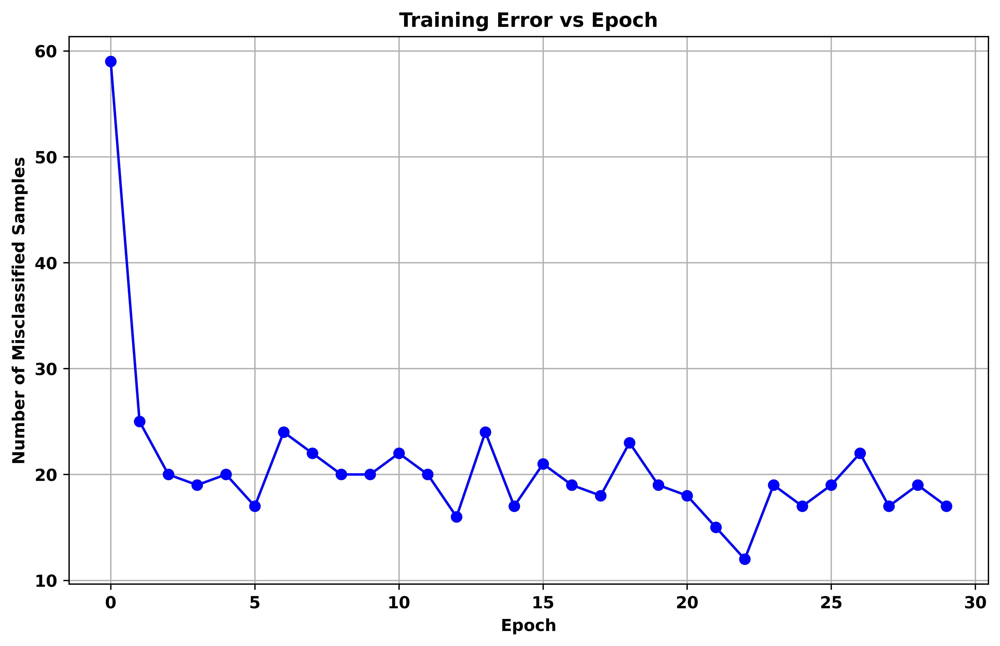

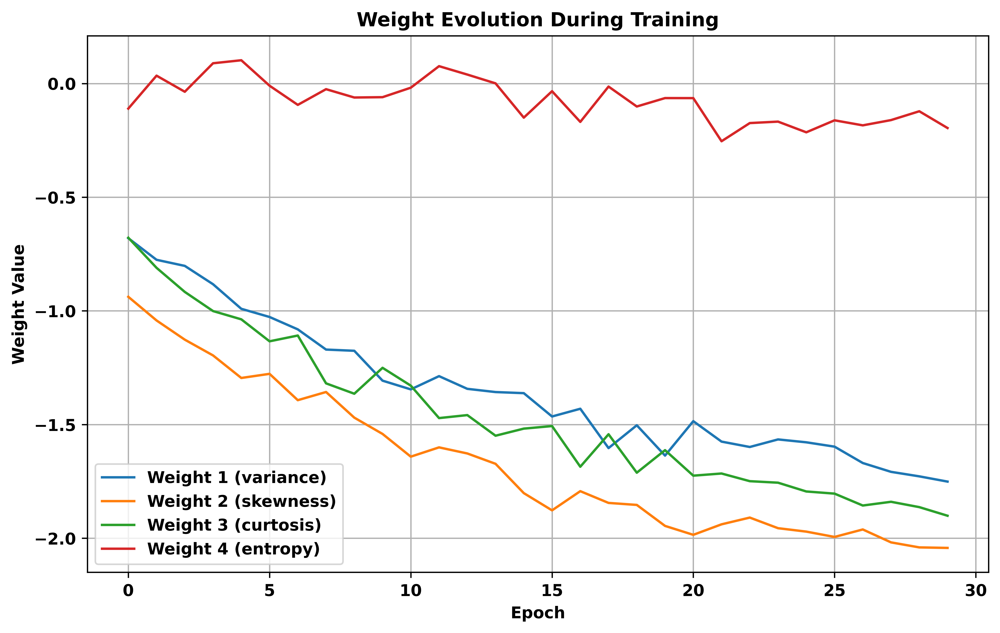

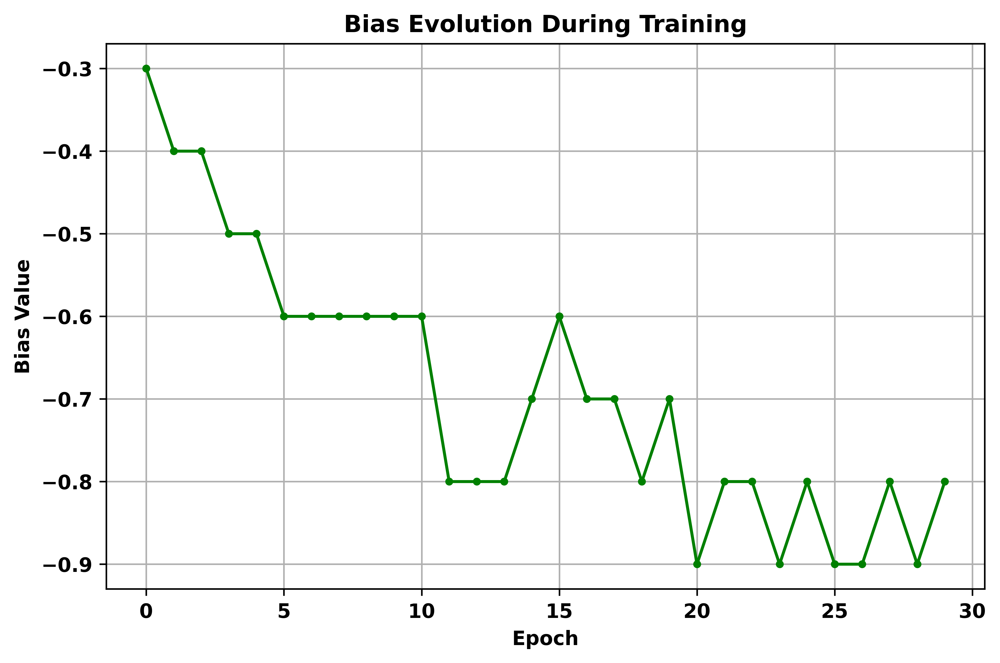

Model Evaluation Metrics
Accuracy  : 0.9818 (98.18%)
Precision : 0.9606
Recall    : 1.0000
F1-score  : 0.9799

Confusion Matrix:
[[148   5]
 [  0 122]]


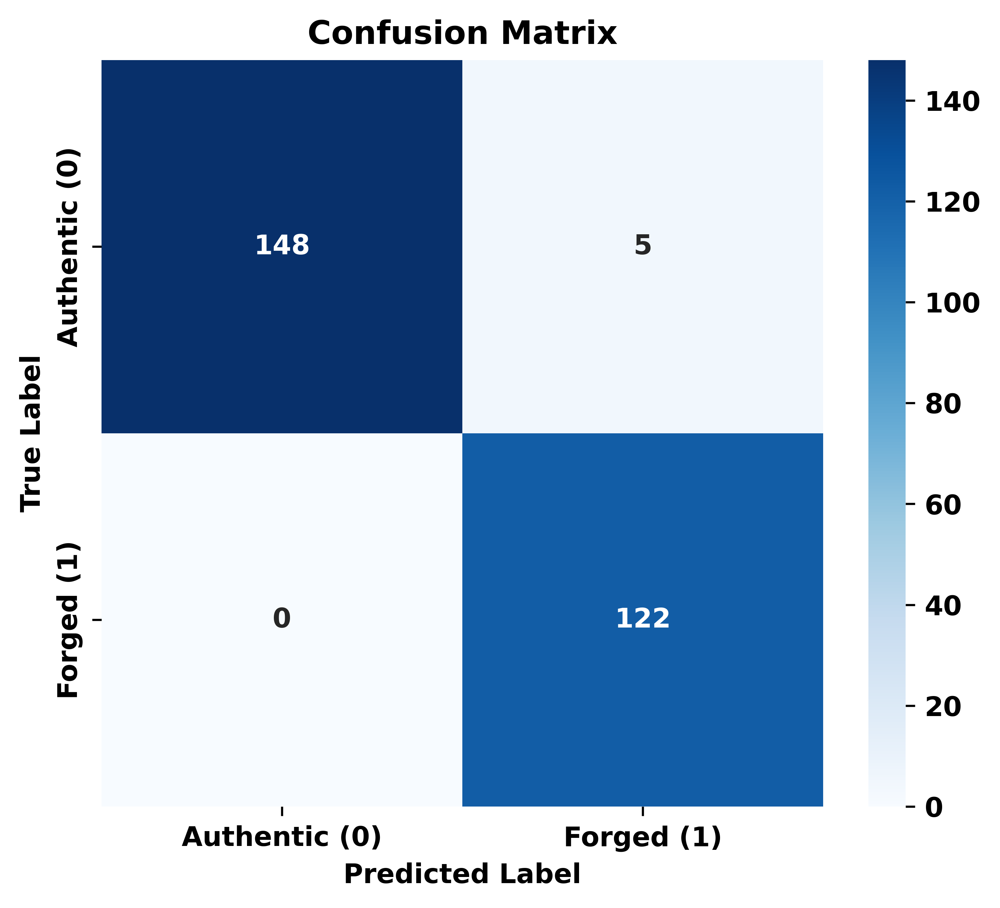

PERFORMANCE SUMMARY TABLE
Metric       Value     
Accuracy     0.9818
Precision    0.9606
Recall       1.0000
F1-score     0.9799


In [10]:
# Additional task : learning rate 0.1
import numpy as np

class Perceptron:
    def __init__(self, learning_rate=0.1, epochs=50):
        self.learning_rate = learning_rate
        self.epochs = epochs
        self.weights = None
        self.bias = None
        self.history = {'weights': [], 'bias': [], 'misclassified': []}

    def step_function(self, x):
        # Step Activation Function
        return np.where(x >= 0, 1, 0)

    def fit(self, X, y):
        # Train the Perceptron
        X = np.array(X)
        y = np.array(y).reshape(-1)

        n_samples, n_features = X.shape

        # Weight and Bias Initialization
        self.weights = np.zeros(n_features)
        self.bias = 0.0

        best_misclassified = float('inf')
        best_weights = self.weights.copy()
        best_bias = self.bias

        for epoch in range(1, self.epochs + 1):
            misclassified = 0

            for i in range(n_samples):
                # Forward Propagation
                linear_output = np.dot(X[i], self.weights) + self.bias
                y_pred = self.step_function(linear_output)

                # Perceptron Learning Rule
                error = y[i] - y_pred

                if error != 0:
                    # Update weights and bias
                    self.weights += self.learning_rate * error * X[i]
                    self.bias += self.learning_rate * error
                    misclassified += 1

            # Store history
            self.history['weights'].append(self.weights.copy())
            self.history['bias'].append(self.bias)
            self.history['misclassified'].append(misclassified)

            if misclassified < best_misclassified:
              best_misclassified = misclassified
              best_weights = self.weights.copy()
              best_bias = self.bias

        self.weights = best_weights
        self.bias = best_bias

        return self

    def predict(self, X):
        # Make predictions
        X = np.array(X)
        linear_output = np.dot(X, self.weights) + self.bias
        return self.step_function(linear_output)


# Initialize
perceptron = Perceptron(learning_rate=0.1, epochs=30)

# Train
perceptron.fit(X_train, y_train)

errors_lr_01 = perceptron.history['misclassified']

# Display
print(f"{'Epoch':<6} | {'Misclassified':<15} | {'Weights':<37} | {'Bias':<10}")

# Print every epoch from history
for epoch in range(1, perceptron.epochs + 1):
    w = np.round(perceptron.history['weights'][epoch-1], 4)
    b = perceptron.history['bias'][epoch-1]
    m = perceptron.history['misclassified'][epoch-1]
    weights_str = '[' + ' '.join(f'{val:8.4f}' for val in w) + ']'
    print(f"{epoch:<6} | {m:<15} | {weights_str} | {b:.6f}")

print("\n" + "="*130)
print("FINAL RESULT")
print("="*130)
print(f"Final Weights : {np.round(perceptron.weights, 6)}")
print(f"Final Bias    : {perceptron.bias:.6f}")

# Training Error vs Epoch
plt.figure(figsize=(10, 6))
plt.plot(perceptron.history['misclassified'], marker='o', color='blue')
plt.title('Training Error vs Epoch')
plt.xlabel('Epoch')
plt.ylabel('Number of Misclassified Samples')
plt.grid(True)
plt.savefig('training_error_vs_epoch.eps', dpi=600, bbox_inches='tight')
plt.show()

# Weight Evolution
weights_hist = np.array(perceptron.history['weights'])
plt.figure(figsize=(10, 6))
for i in range(weights_hist.shape[1]):
    plt.plot(weights_hist[:, i], label=f'Weight {i+1} ({df.columns[i]})')
plt.title('Weight Evolution During Training')
plt.xlabel('Epoch')
plt.ylabel('Weight Value')
plt.legend()
plt.grid(True)
plt.savefig('weight_evolution.eps', dpi=600, bbox_inches='tight')
plt.show()

# Bias Evolution
plt.figure(figsize=(8, 5))
plt.plot(perceptron.history['bias'], marker='.', color='green')
plt.title('Bias Evolution During Training')
plt.xlabel('Epoch')
plt.ylabel('Bias Value')
plt.grid(True)
plt.savefig('bias_evolution.eps', dpi=600, bbox_inches='tight')
plt.show()

# Make predictions on test set
y_pred = perceptron.predict(X_test)

# Compute Metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

print("Model Evaluation Metrics")
print(f"Accuracy  : {accuracy:.4f} ({accuracy*100:.2f}%)")
print(f"Precision : {precision:.4f}")
print(f"Recall    : {recall:.4f}")
print(f"F1-score  : {f1:.4f}")

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
print("\nConfusion Matrix:")
print(cm)

# Plot Confusion Matrix
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Authentic (0)', 'Forged (1)'],
            yticklabels=['Authentic (0)', 'Forged (1)'])
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.savefig('confusion_matrix.eps', dpi=600, bbox_inches='tight')
plt.show()

# Performance Table
print("PERFORMANCE SUMMARY TABLE")
print(f"{'Metric':<12} {'Value':<10}")
print(f"{'Accuracy':<12} {accuracy:.4f}")
print(f"{'Precision':<12} {precision:.4f}")
print(f"{'Recall':<12} {recall:.4f}")
print(f"{'F1-score':<12} {f1:.4f}")

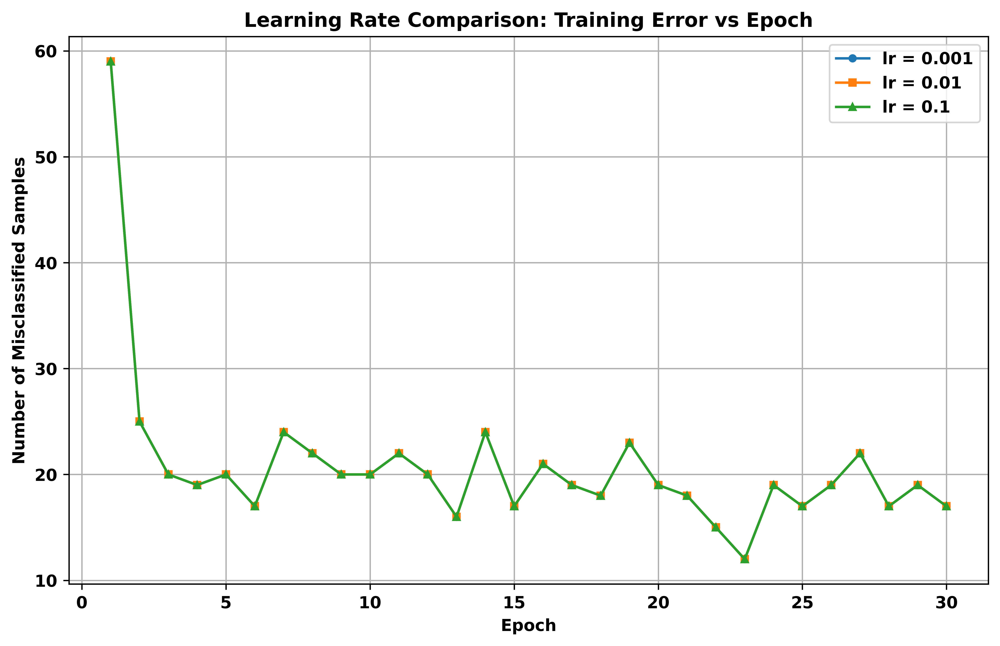

In [11]:
# Learning rate comparison

plt.figure(figsize=(10, 6))

plt.plot(range(1, len(errors_lr_0001) + 1), errors_lr_0001,
          marker='o', markersize=4, label='lr = 0.001')
plt.plot(range(1, len(errors_lr_001) + 1), errors_lr_001,
          marker='s', markersize=4, label='lr = 0.01')
plt.plot(range(1, len(errors_lr_01) + 1), errors_lr_01,
          marker='^', markersize=4, label='lr = 0.1')

plt.title('Learning Rate Comparison: Training Error vs Epoch')
plt.xlabel('Epoch')
plt.ylabel('Number of Misclassified Samples')
plt.legend()
plt.grid(True)
plt.savefig('learning_rate_comparison.eps', dpi=600, bbox_inches='tight')
plt.show()

In [12]:
# Additional task : compare with scikit-learn
from sklearn.linear_model import Perceptron
from sklearn.metrics import accuracy_score

sklearn_perceptron = Perceptron(max_iter=30, eta0=0.01, random_state=42)
sklearn_perceptron.fit(X_train, y_train)
y_pred_sk = sklearn_perceptron.predict(X_test)
print("Scikit-learn Accuracy:", accuracy_score(y_test, y_pred_sk))

Scikit-learn Accuracy: 0.9745454545454545
